# Imports

In [9]:
import sys
sys.path.insert(1, '../..')

import convml_tt
from utils import *

from convml_tt.system import TripletTrainerModel, TripletTrainerDataModule
from convml_tt.data.examples import fetch_example_dataset, ExampleData, fetch_pretrained_model, PretrainedModel
from convml_tt.data.dataset import TileType, ImageSingletDataset
from convml_tt.utils import get_embeddings
import convml_tt.interpretation
import cv2
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib.patches import Polygon
from matplotlib.collections import PatchCollection

import xarray as xr
import pandas as pd
import pytorch_lightning as pl
from matplotlib.patches import Polygon
from matplotlib.collections import PatchCollection
import torch
from sklearn.decomposition import PCA
from PIL import Image
import os, shutil
from matplotlib.patches import Rectangle as rectan
from random import seed
from random import randint
from sklearn.metrics import confusion_matrix

import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.neighbors import NearestCentroid
from tqdm.notebook import tqdm


from convml_tt.interpretation.rectpred.transform import apply_transform
from convml_tt.data.examples import load_pretrained_model, PretrainedModel
from convml_tt.interpretation.rectpred.data import make_sliding_tile_model_predictions
from convml_tt.interpretation.rectpred.plot import make_rgb


TILE_FILENAME_FORMAT = "{triplet_id:05d}_{tile_type}.png"
TEST_SIZE = 0.3
RANDOM_STATE = 1024
COLORS = ['b', 'g', 'r', 'm'] # Color of each class
associations = ['Fish', 'Flower', 'Gravel', 'Sugar']
#DATASET_DIR = "../../../NC/zooniverse/"
DATASETS_path = "/home/fbrient/Dropbox/Documents/EUREC4A/Data/"
DATASET_DIR   = DATASETS_path+"Kaggle/"
print(cv2.__version__)
print(np.__version__)
pca = PCA(n_components=3, svd_solver='arpack')

4.5.3
1.20.1


/home/fbrient/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


## Reading Leif Model

In [10]:
model_path = fetch_pretrained_model(pretrained_model=PretrainedModel.FIXED_NORM_STAGE2, data_dir="../../")
#model = TripletTrainerModel.load_from_checkpoint(checkpoint_path="c:/Users/Ray/Documents/Stage/MODELS/checkpt")
model = TripletTrainerModel.load_from_checkpoint(checkpoint_path="/home/fbrient/Dropbox/Documents/Stages/2021/IA/Internship_files/models/Tile2Vec/zooniverse-model.ckpt")
print(PretrainedModel.FIXED_NORM_STAGE2)
print(model_path)
print(model)

/home/fbrient/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Using downloaded and verified file: ../../fixednorm-stage-2.tgz
Extracting ../../fixednorm-stage-2.tgz to ../../
PretrainedModel.FIXED_NORM_STAGE2
../../fixednorm-stage-2.torch.pkl
TripletTrainerModel(
  (backbone): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Sequential(
      (0): MaxPool2d(kernel_size=2, stride=1, padding=0, dilation=1, ceil_mode=False)
      (1): BlurPool(
        (pad): ReflectionPad2d((1, 2, 1, 2))
      )
    )
    (4): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): Bat

## Reading Zooniverse dataset downloaded from : https://www.kaggle.com/c/understanding_cloud_organization/data

In [11]:
#df = pd.read_csv("../../../NC/zooniverse/train.csv")
df = pd.read_csv(DATASET_DIR+"train.csv")
print(DATASET_DIR+"train.csv")

/home/fbrient/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train.csv


In [12]:
print(df)

              Image_Label                                      EncodedPixels
0        0011165.jpg_Fish  264918 937 266318 937 267718 937 269118 937 27...
1      0011165.jpg_Flower  1355565 1002 1356965 1002 1358365 1002 1359765...
2      0011165.jpg_Gravel                                                NaN
3       0011165.jpg_Sugar                                                NaN
4        002be4f.jpg_Fish  233813 878 235213 878 236613 878 238010 881 23...
...                   ...                                                ...
22179   ffd6680.jpg_Sugar                                                NaN
22180    ffea4f4.jpg_Fish                                                NaN
22181  ffea4f4.jpg_Flower  1194860 675 1196260 675 1197660 675 1199060 67...
22182  ffea4f4.jpg_Gravel                                                NaN
22183   ffea4f4.jpg_Sugar                                                NaN

[22184 rows x 2 columns]


/home/fbrient/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


## Preparing different columns of dataframe

In [13]:
df['Image'] = df['Image_Label'].map(lambda x: x.split('_')[0])
df['Class'] = df['Image_Label'].map(lambda x: x.split('_')[1])
classes = df['Class'].unique()
train_df = df.groupby('Image')['Class'].agg(set).reset_index()
print(train_df)
for class_name in classes:
    df[class_name] = df['Class'].map(lambda x: 1 if class_name in x else 0)
df.head()

            Image                          Class
0     0011165.jpg  {Fish, Flower, Gravel, Sugar}
1     002be4f.jpg  {Fish, Flower, Gravel, Sugar}
2     0031ae9.jpg  {Fish, Flower, Gravel, Sugar}
3     0035239.jpg  {Fish, Flower, Gravel, Sugar}
4     003994e.jpg  {Fish, Flower, Gravel, Sugar}
...           ...                            ...
5541  ffcedf2.jpg  {Fish, Flower, Gravel, Sugar}
5542  ffd11b6.jpg  {Fish, Flower, Gravel, Sugar}
5543  ffd3dfb.jpg  {Fish, Flower, Gravel, Sugar}
5544  ffd6680.jpg  {Fish, Flower, Gravel, Sugar}
5545  ffea4f4.jpg  {Fish, Flower, Gravel, Sugar}

[5546 rows x 2 columns]


/home/fbrient/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,Image_Label,EncodedPixels,Image,Class,Fish,Flower,Gravel,Sugar
0,0011165.jpg_Fish,264918 937 266318 937 267718 937 269118 937 27...,0011165.jpg,Fish,1,0,0,0
1,0011165.jpg_Flower,1355565 1002 1356965 1002 1358365 1002 1359765...,0011165.jpg,Flower,0,1,0,0
2,0011165.jpg_Gravel,NaN,0011165.jpg,Gravel,0,0,1,0
3,0011165.jpg_Sugar,NaN,0011165.jpg,Sugar,0,0,0,1
4,002be4f.jpg_Fish,233813 878 235213 878 236613 878 238010 881 23...,002be4f.jpg,Fish,1,0,0,0


## Preparing functions to extract masks of bounding boxes

In [14]:
# Creating training samples

image_col = np.array(df['Image'])
image_files = image_col[::4]
#print(type(image_files))
#print(type(np.unique(image_col)))
all_labels = df['Class']
#print(all_labels)
X_train, y_train = image_files, all_labels
train_pairs = np.array(list(zip(X_train, y_train)))
print(train_pairs.shape)
#TILE_FILENAME_FORMAT = "{triplet_id:05d}_{tile_type}.png"
NUM_TRAIN_SAMPLES = len(train_pairs)
train_samples = train_pairs[np.random.choice(train_pairs.shape[0], NUM_TRAIN_SAMPLES, replace=False), :]
print(train_pairs)

(5546, 2)
[['0011165.jpg' 'Fish']
 ['002be4f.jpg' 'Flower']
 ['0031ae9.jpg' 'Gravel']
 ...
 ['ffd3dfb.jpg' 'Sugar']
 ['ffd6680.jpg' 'Fish']
 ['ffea4f4.jpg' 'Flower']]


/home/fbrient/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


## Creating training tile dataset

/home/fbrient/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


  0%|          | 0/5546 [00:00<?, ?it/s]

<ipython-input-15-57741cff6d09>:62: DeprecationWarning: `np.str` is a deprecated alias for the builtin `str`. To silence this warning, use `str` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.str_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  ax.set_title('{} - ({})'.format(sample[0], ', '.join(sample[1].astype(np.str))))


/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/a40efee.jpg


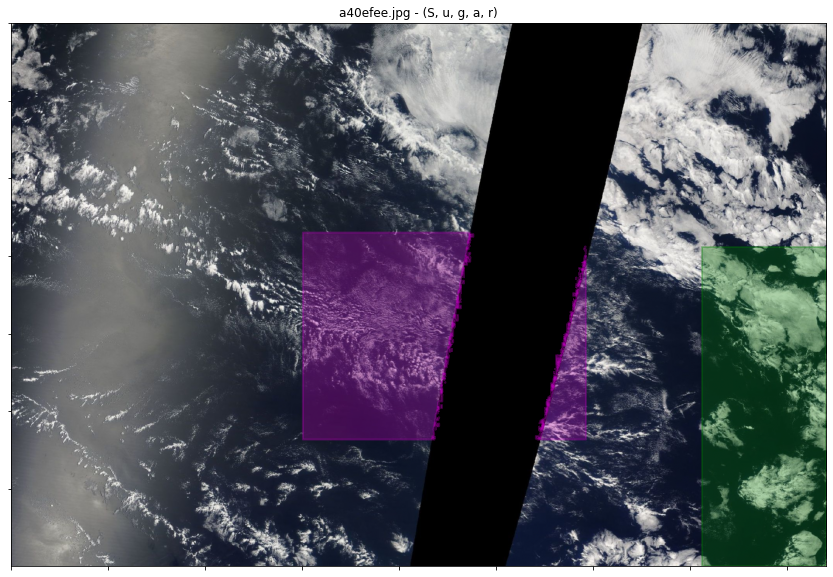

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/9ebe77d.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00000_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00001_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00002_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00003_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00004_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00005_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00006_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00007_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00008_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00009_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/t

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00095_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/5291a8b.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/0d81f99.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00096_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00097_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00098_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00099_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00100_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/a47732c.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00101_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00102_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/001

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/ae51b05.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/872b64a.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00164_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00165_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00166_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00167_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/148a6ef.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00168_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00169_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00170_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00171_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/001

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/06f1f1f.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/23a172f.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00251_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/33b39e2.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00252_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00253_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00254_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00255_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00256_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00257_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00258_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/002

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/59faffb.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/4dc7608.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00328_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00329_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00330_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00331_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00332_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00333_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00334_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00335_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/13df2eb.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/003

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/97bbcba.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/9975e3c.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/90e37a7.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00409_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00410_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00411_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/ea4f338.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00412_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00413_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/130f074.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00414_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00415_anchor.png
/home/

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00492_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00493_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/a381186.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00494_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00495_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00496_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00497_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00498_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00499_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00500_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/221b3c5.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_image

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00569_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00570_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00571_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00572_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00573_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00574_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00575_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00576_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00577_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00578_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00579_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Dat

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00651_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00652_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00653_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00654_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00655_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00656_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00657_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/1f2b25e.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00658_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00659_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/04f9039.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_image

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00721_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00722_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00723_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00724_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00725_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00726_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00727_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00728_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/5977273.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00729_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00730_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVER

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/f70c98c.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00821_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/1d20d37.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00822_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00823_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/c06322b.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/537fa5b.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00824_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/81803ef.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00825_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00826_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00827_anchor.png
/home/

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00894_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00895_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00896_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00897_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00898_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00899_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/37266a4.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00900_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00901_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00902_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00903_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVER

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00991_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00992_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00993_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00994_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00995_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00996_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00997_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00998_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/a0f2dfa.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/00999_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01000_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVER

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01076_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01077_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01078_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01079_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01080_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01081_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01082_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/cc475c4.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/f19a7ed.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/5f89bdd.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01083_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/010

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01157_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/b8c9c50.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/13fae6e.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01158_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01159_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01160_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01161_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01162_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01163_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01164_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01165_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01240_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01241_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01242_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/e0c2169.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/647ee60.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/d29a30a.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01243_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01244_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01245_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01246_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01247_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/012

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01330_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/2de004a.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/dc37348.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01331_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01332_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01333_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01334_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01335_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01336_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01337_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01338_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01414_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01415_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01416_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/f516a20.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01417_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01418_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01419_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01420_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01421_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/2502390.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/9871dc7.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/014

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/fcf7655.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01496_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01497_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/92431c7.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01498_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01499_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/c5d4d6f.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01500_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01501_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01502_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01503_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/e4b02d9.

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01573_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01574_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01575_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01576_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01577_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01578_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01579_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01580_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01581_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01582_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01583_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Dat

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/27fc552.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01665_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01666_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01667_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01668_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01669_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01670_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01671_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01672_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01673_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01674_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVER

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01745_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01746_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01747_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01748_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01749_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01750_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/73bc1f8.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01751_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01752_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01753_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01754_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVER

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01825_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/04029b4.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01826_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01827_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01828_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01829_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01830_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01831_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01832_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01833_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/aef42dc.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/c3ea016.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01913_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01914_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01915_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01916_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01917_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01918_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01919_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01920_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/09e313c.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/586b980.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/ae89b56.

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01998_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/fa0753f.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/d43600c.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/5481727.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/01999_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/7bd90b9.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02000_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/4d7bcd8.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02001_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/5e502b0.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/edb7608.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/ed48a59.jpg
/home/fbrient/Dropbox/Documents/EURE

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/7f8b999.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02077_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02078_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02079_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02080_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/913fa0d.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02081_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02082_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/060ce39.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02083_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02084_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/020

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02162_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02163_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02164_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/bed08ae.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/a037167.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02165_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/76807a8.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02166_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02167_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02168_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/3874f5b.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/63b45f9.jpg
/home/

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/6c2bd59.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02252_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02253_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02254_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02255_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/d9b3608.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02256_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02257_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02258_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02259_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/d3f605d.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/84ed9ef.

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02331_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02332_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02333_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02334_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/f89ae7c.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02335_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02336_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02337_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/81282b6.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02338_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02339_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_image

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02405_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02406_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02407_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/8778ea0.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02408_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02409_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02410_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02411_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02412_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02413_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02414_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/t

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02488_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02489_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02490_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02491_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/022d78c.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02492_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02493_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/a92ea02.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02494_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02495_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02496_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/f98a258.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/c806fcf.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02576_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02577_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02578_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02579_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/ee09289.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02580_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/0ad0a05.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02581_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02582_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02583_anchor.

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/c6b1b36.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/403a9b2.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02654_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02655_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02656_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02657_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02658_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02659_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02660_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/db483a2.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02661_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/026

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02740_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02741_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/dbe7fef.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02742_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02743_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02744_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02745_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02746_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/e8026e4.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/df69207.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/1d6d628.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/827be4f.jpg
/home/

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/cbd6a81.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02825_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02826_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02827_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02828_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02829_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/8d940f5.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02830_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02831_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02832_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/bb62c4a.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/028

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02911_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/74ade11.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/963c6db.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02912_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02913_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02914_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02915_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02916_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/6d7b2ff.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02917_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02918_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/029

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02983_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02984_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02985_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02986_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02987_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02988_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02989_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02990_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02991_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02992_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/02993_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Dat

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/0269e9a.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03066_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03067_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03068_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03069_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03070_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03071_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03072_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03073_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03074_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03075_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVER

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/8bf41bf.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03145_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03146_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03147_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03148_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03149_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03150_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03151_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03152_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03153_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/c401cc0.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03226_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03227_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03228_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03229_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03230_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03231_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03232_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03233_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03234_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03235_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03236_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Dat

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/7de7314.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03307_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/28086d0.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/8cf761f.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/fa4db3e.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/1c3a47b.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03308_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03309_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03310_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03311_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03312_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03313_anchor.png
/home/

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/080c004.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/be7fc9d.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03389_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03390_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03391_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/13d3608.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03392_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03393_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03394_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03395_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03396_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/033

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/0095357.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/96ce1b3.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/0766057.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/0e9deba.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03484_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/ff4222b.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03485_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03486_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03487_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03488_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03489_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03490_anchor.png
/home/

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/6c7d590.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03558_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03559_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03560_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03561_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03562_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03563_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03564_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03565_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03566_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03567_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVER

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/1524b90.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/0b5a667.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03644_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03645_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/6915f6d.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03646_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03647_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03648_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03649_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03650_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03651_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/036

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03719_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03720_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03721_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03722_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03723_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/a90bca4.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/b8add71.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03724_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03725_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03726_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/d9433e5.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/037

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/6f6c8b5.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/19047cf.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03804_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03805_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03806_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03807_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03808_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03809_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/0d24e80.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/4d1efc1.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03810_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03811_anchor.

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03896_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03897_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03898_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03899_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03900_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/0e2612c.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03901_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03902_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/4d256f4.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/159985f.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03903_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/039

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/068d881.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/bdbc6c6.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03979_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03980_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03981_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03982_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/18221ff.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/db0a057.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03983_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03984_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/03985_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/6bd6c02.jpg
/home/

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/b799983.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04068_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04069_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04070_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04071_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04072_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04073_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04074_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04075_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/d19d9f9.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04076_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04151_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/a1c1ba9.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/f50c84e.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04152_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04153_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04154_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04155_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04156_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04157_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04158_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04159_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/2485e01.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/1eefbee.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04245_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04246_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04247_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04248_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04249_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04250_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04251_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04252_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04253_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/672fd54.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04336_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/7b65d41.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04337_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/ab98b1b.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04338_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04339_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/b9c0279.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04340_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04341_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/a7f3ac5.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/1c25e19.jpg
/home/fbrient/Dr

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04407_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04408_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04409_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04410_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04411_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04412_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/d61faff.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/2a5ea2e.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04413_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04414_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04415_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04485_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04486_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04487_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/d66266c.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04488_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04489_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04490_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04491_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04492_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/f2113c0.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04493_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/b0422d7.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04555_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/60300f3.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04556_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04557_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04558_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/3614409.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04559_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04560_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04561_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/f838ec2.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04562_anchor.

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04643_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/806cac6.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/c2d6a30.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04644_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04645_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04646_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04647_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04648_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04649_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04650_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04651_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/1b15954.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04736_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04737_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/c46fe67.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04738_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04739_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04740_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04741_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04742_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04743_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04744_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/f2805f4.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04812_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04813_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04814_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04815_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04816_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04817_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04818_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04819_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04820_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/979c0b0.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/97f678e.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/34982aa.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04901_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04902_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04903_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04904_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04905_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04906_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04907_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/de5fc13.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04908_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/049

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04984_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04985_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/4ae6cea.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04986_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/2012217.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04987_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04988_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04989_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04990_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04991_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/04992_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05061_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/888f3b3.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05062_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05063_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05064_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05065_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05066_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05067_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05068_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05069_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05070_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVER

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05144_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05145_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05146_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05147_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05148_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05149_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05150_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/d1c0f8b.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/4a4dd10.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/d84a0d8.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05151_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/dbf939c.

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05223_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05224_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05225_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05226_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/0a4657d.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05227_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/6c42e31.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05228_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/6abfdd7.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05229_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05230_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/052

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05301_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05302_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05303_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/19807b1.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05304_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05305_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05306_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/b5e66bc.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/5d15595.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05307_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05308_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/053

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/0718a60.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05376_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/8e259ea.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05377_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/e703d29.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05378_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05379_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05380_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05381_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/1e637ce.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05382_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05383_anchor.

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/5e94ac3.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/8b7a2a7.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05464_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05465_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/e681e81.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05466_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05467_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05468_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05469_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05470_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05471_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/3c89cc8.

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05535_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/8816d0d.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05536_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05537_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05538_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05539_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05540_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05541_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/9894cfc.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05542_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05543_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/9aacc76.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05616_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05617_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05618_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05619_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05620_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05621_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05622_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05623_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05624_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05625_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVER

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05704_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05705_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/dc124af.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05706_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05707_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05708_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/8667994.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05709_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05710_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05711_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05712_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05787_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/9f9e827.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05788_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05789_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05790_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05791_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05792_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05793_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05794_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05795_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05796_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVER

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05871_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05872_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05873_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/118da86.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05874_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05875_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/b0bd415.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/df4b050.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05876_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05877_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05878_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/058

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05945_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05946_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05947_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05948_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05949_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05950_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05951_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/b502862.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05952_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05953_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/05954_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVER

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06024_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06025_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06026_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06027_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06028_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06029_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06030_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06031_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06032_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06033_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06034_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Dat

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06107_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06108_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06109_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06110_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06111_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06112_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06113_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06114_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06115_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06116_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/d826b89.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/t

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06186_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06187_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06188_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06189_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06190_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06191_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/296636d.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/bbf0cf8.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06192_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06193_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06194_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06271_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06272_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06273_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06274_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06275_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06276_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06277_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06278_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06279_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06280_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06281_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Dat

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/9f4ef37.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/b13672c.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/542837e.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/1909098.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06352_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06353_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06354_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06355_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/49d3729.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06356_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06357_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06358_anchor.png
/home/

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06436_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06437_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/723bc2e.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06438_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06439_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06440_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06441_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06442_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06443_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06444_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06445_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVER

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/2581372.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06514_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06515_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06516_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06517_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06518_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06519_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06520_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06521_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06522_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06523_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVER

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06597_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06598_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06599_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06600_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06601_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06602_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/3117d1b.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06603_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06604_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/182254d.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/0e9c181.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/066

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/8bc5e41.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06684_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06685_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06686_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06687_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06688_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/1824735.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06689_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06690_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/0118bff.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06691_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/066

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06777_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06778_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06779_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06780_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06781_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06782_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06783_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/8d68de6.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06784_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06785_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/ccfff5f.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_image

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06857_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06858_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06859_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06860_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06861_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06862_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/3fd1595.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06863_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06864_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06865_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06866_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVER

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06935_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06936_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06937_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06938_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06939_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06940_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06941_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06942_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06943_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06944_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/06945_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Dat

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07026_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07027_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07028_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07029_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07030_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07031_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07032_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07033_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/c4c7b06.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/a6ac926.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/990f987.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/530bba4.

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07097_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07098_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07099_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07100_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07101_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/ba873e1.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07102_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/b4c8bbc.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07103_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07104_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07105_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_image

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/0eba747.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07182_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07183_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07184_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/c73f63c.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07185_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07186_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07187_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07188_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07189_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07190_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07273_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07274_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07275_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/479d78e.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07276_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/581337f.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07277_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07278_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07279_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/7f44f7f.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07280_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/072

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/7c17a4a.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07355_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07356_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07357_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07358_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07359_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07360_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07361_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07362_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07363_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07364_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVER

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07432_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07433_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/16bdc2f.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07434_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07435_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07436_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07437_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/180dab9.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07438_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07439_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/23f4ac4.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/074

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07505_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07506_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07507_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07508_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07509_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07510_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07511_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07512_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/0031ae9.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07513_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07514_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVER

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07582_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/66f6125.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/d33a8e2.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/30f380c.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07583_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07584_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07585_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/26a1574.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/eda72ce.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07586_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07587_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07588_anchor.png
/home/

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07649_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07650_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07651_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/e952209.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07652_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07653_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07654_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07655_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07656_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07657_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07658_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVER

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07731_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07732_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07733_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07734_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07735_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07736_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07737_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/e80676a.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07738_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07739_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07740_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVER

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07833_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/8d369c9.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07834_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07835_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07836_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07837_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07838_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07839_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07840_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07841_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07842_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVER

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07920_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07921_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07922_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/6ecce99.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07923_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07924_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07925_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07926_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07927_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07928_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07929_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVER

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/181395a.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07994_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07995_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07996_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07997_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07998_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/07999_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/f9743d9.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08000_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08001_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/bcac265.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/080

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08075_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/b0bbd2c.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/e00ba80.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08076_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/2b51f11.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08077_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08078_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08079_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08080_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08081_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/bc40735.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08082_anchor.

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08157_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08158_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08159_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08160_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/b897fda.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/06d6a41.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08161_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08162_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08163_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08164_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08165_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/c94cf48.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08242_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08243_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08244_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/9147a8d.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08245_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08246_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08247_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08248_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08249_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08250_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/fc83765.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/c0dadad.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08338_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08339_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/c88b02e.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08340_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08341_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08342_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08343_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/2a4da73.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08344_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08345_anchor.

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08425_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08426_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08427_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08428_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08429_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08430_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/8201178.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08431_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08432_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08433_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08434_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVER

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08515_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08516_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08517_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08518_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/8176714.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/c33a114.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08519_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08520_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08521_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08522_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08523_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08595_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08596_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08597_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/0f91409.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08598_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08599_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08600_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/404ad93.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/8e46e77.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/dd9573c.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/270dbf3.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/7844c28.jpg
/home/fbrient/Dr

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/a000c51.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08674_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/89c1070.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08675_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08676_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/3b41be4.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08677_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08678_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08679_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08680_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08681_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/086

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08753_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08754_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/948a898.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08755_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08756_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/56e29f4.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/f411051.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/f7be34b.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/4736d30.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08757_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08758_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08759_anchor.png
/home/

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08832_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08833_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/e5acc2e.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08834_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/7fa5eba.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08835_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08836_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/bbea5f7.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08837_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08838_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/47b2950.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08839_anchor.

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08916_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08917_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/0c88342.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/713b3d9.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08918_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08919_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08920_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08921_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08922_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08923_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08924_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08990_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08991_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08992_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08993_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08994_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08995_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08996_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08997_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08998_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/08999_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09000_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Dat

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09063_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09064_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09065_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09066_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09067_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09068_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09069_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09070_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/5abb7ba.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09071_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09072_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVER

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09147_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09148_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/6be66c4.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09149_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/3f89ff9.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09150_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09151_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09152_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09153_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09154_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09155_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09228_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09229_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09230_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09231_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09232_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09233_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/86d5dda.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09234_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09235_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09236_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09237_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVER

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09326_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09327_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09328_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09329_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/d84db76.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09330_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09331_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09332_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/b548fa2.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09333_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/30b1cf6.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/093

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/0ddf358.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09408_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09409_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09410_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/05c0dfb.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/0afaa7f.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/0dfbb7e.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/9cc537c.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/6b25d02.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09411_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/40dd239.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09412_anchor.png
/home/fbrient/Dropbox/Docu

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09488_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09489_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/eeaefcd.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09490_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09491_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/28e90ae.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09492_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09493_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09494_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09495_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09496_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09574_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09575_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09576_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/93dda31.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/4221331.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09577_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09578_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/0f529c5.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09579_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09580_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09581_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/095

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09646_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09647_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09648_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09649_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09650_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09651_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09652_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/345e596.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09653_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09654_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09655_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVER

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09740_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09741_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09742_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09743_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09744_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09745_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/1b0df6d.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09746_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09747_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09748_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09749_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/t

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09822_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09823_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/e3ecaca.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09824_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/d148efe.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09825_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09826_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09827_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09828_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09829_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09830_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09910_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09911_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09912_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/c62a389.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09913_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/3faf64c.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09914_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09915_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/70cba5c.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/80752ff.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09916_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09917_anchor.

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09984_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09985_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09986_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09987_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09988_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09989_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/40b8854.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09990_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09991_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/09992_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/9d8b561.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10061_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10062_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10063_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10064_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10065_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10066_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10067_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10068_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/10cbb5e.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/5ee76bb.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10069_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10134_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10135_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10136_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10137_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/3c47db3.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10138_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10139_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10140_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/141a13c.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/31e27bd.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10141_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/101

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10212_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10213_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10214_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/2a9a669.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10215_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10216_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10217_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10218_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/a6db5f7.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10219_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10220_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_image

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10297_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/2bcc55e.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10298_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10299_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10300_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10301_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10302_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10303_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10304_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10305_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10306_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVER

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10377_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10378_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10379_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10380_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10381_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10382_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/80c5371.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10383_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10384_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10385_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/7e52c6f.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10469_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10470_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10471_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10472_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10473_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10474_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/ecc7602.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10475_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10476_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10477_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10478_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/t

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10544_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10545_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10546_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/2b74889.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/7b65d2e.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/6dccb65.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10547_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10548_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10549_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10550_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10551_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/105

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10615_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10616_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10617_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10618_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10619_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10620_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10621_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10622_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/7c9fed9.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/4ce7229.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10623_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10704_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10705_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10706_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10707_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/a59b0b6.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/48fce1f.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/465e214.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10708_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10709_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10710_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10711_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/107

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10774_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10775_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10776_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10777_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10778_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10779_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10780_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10781_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10782_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10783_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/d4437b2.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/t

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/d4115fc.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10856_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10857_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10858_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10859_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10860_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10861_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10862_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10863_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10864_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10865_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVER

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10946_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10947_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/1e6f0a5.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10948_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10949_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10950_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10951_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10952_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/10953_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/cc61cfb.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/65d4ea5.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/109

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11036_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11037_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11038_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11039_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11040_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/6f96f34.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11041_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11042_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11043_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11044_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/984c799.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/d3dfa34.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11116_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/ab3cba9.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11117_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/0432314.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11118_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11119_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11120_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11121_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11122_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/971c229.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/eb4fbdc.jpg
/home/

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/8964c9a.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/803e366.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11185_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11186_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11187_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11188_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11189_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11190_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/2e00025.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11191_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11192_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/111

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11275_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11276_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/fc15eb7.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/9febeb9.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11277_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11278_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11279_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11280_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11281_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11282_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/ae89301.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/112

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11358_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11359_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11360_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11361_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11362_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11363_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11364_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/ebcd2d6.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/539f578.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11365_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11366_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_image

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11440_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/c1748a5.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/d2a540d.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/dc6b7c0.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/acfb940.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/5eef1a6.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11441_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11442_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11443_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11444_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11445_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/7250b61.jpg
/home/fbrient/Dr

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11532_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11533_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11534_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11535_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11536_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/6fbb8c4.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/ed3c46c.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/a863356.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11537_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11538_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11539_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/115

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11621_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11622_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11623_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11624_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/78a2d53.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11625_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/87fffff.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/4f85cca.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11626_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/ddf11b5.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/907f1ba.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/36bc4ed.jpg
/home/fbrient/Dr

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11698_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/e674a99.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11699_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11700_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11701_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11702_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/77490dc.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/2a7aaee.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11703_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11704_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11705_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/117

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11790_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11791_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11792_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11793_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11794_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11795_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11796_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11797_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11798_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11799_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11800_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Dat

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/1f846aa.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/993e07b.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11876_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11877_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11878_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11879_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/a66252e.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/ccafdde.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/e8e25ab.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11880_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/0745d08.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11881_anchor.png
/home/fbrient/Dr

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11958_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/aa56c99.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/7b1e302.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11959_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11960_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11961_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11962_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/db6052a.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/6b9ad76.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11963_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11964_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/11965_anchor.

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/8d07a73.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12050_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12051_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12052_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/0e8c498.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12053_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12054_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12055_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12056_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12057_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/45d84b0.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/120

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/4334b72.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12131_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12132_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12133_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12134_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12135_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12136_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/a9d9a95.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12137_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12138_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/f58541c.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/40f4a1b.

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/7d07b03.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12207_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/24f8df3.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12208_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12209_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12210_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12211_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/7efc7ea.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12212_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12213_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12214_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/122

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/0a89811.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/d9f3a39.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/3e3b5b1.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12290_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12291_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12292_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12293_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12294_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12295_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12296_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12297_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/122

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12376_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12377_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12378_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12379_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/385672f.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12380_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12381_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12382_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/5c9625b.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12383_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12384_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12464_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/7e820d6.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/26a68cf.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/a9f796c.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12465_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12466_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12467_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/6550e47.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12468_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12469_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12470_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12471_anchor.

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12541_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12542_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12543_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12544_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12545_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12546_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12547_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12548_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/45bb58b.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12549_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12550_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVER

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/5c6d3e7.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12629_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12630_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12631_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12632_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12633_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12634_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12635_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12636_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12637_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12638_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVER

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/afbe855.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12721_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12722_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12723_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12724_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12725_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12726_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12727_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12728_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12729_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12730_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVER

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12805_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12806_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12807_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12808_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12809_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12810_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12811_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/ac3e0eb.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12812_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12813_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12814_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVER

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12900_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12901_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12902_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/58baf3f.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/9cdc586.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/624f5eb.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/79d0279.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12903_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/486dd52.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12904_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12905_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12906_anchor.png
/home/

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12991_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12992_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12993_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/30ab329.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12994_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12995_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12996_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12997_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12998_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/12999_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13000_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/t

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13062_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/48f5078.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13063_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13064_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13065_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13066_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13067_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13068_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13069_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13070_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13071_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVER

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13156_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13157_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13158_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13159_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13160_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13161_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13162_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13163_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13164_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/8df3d43.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13165_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVER

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/1fde3a9.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/8825f6a.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13244_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13245_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13246_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13247_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13248_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13249_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13250_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13251_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13252_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_image

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13318_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13319_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13320_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13321_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13322_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13323_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/0b4fb36.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/3d43805.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/42f2864.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13324_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13325_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/133

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13396_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13397_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13398_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13399_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13400_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13401_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13402_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13403_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13404_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13405_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13406_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Dat

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/4d5151a.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/a84c738.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13476_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/4795dc4.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/61231a7.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/31c1874.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13477_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13478_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13479_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13480_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13481_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13482_anchor.png
/home/

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13551_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13552_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13553_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13554_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13555_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13556_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13557_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13558_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13559_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13560_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13561_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Dat

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13644_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13645_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13646_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/ecfdd08.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13647_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13648_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13649_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13650_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13651_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13652_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13653_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVER

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13723_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13724_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13725_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13726_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13727_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13728_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/535e20f.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/dbd45d8.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13729_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/63881b2.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13730_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/137

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/121ea48.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13807_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13808_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13809_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13810_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13811_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13812_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13813_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13814_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13815_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/51d19b4.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13881_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13882_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13883_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13884_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13885_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13886_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13887_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13888_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/e4eb39c.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13889_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13890_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVER

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13960_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13961_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13962_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13963_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/9901417.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13964_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/3e16ccd.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13965_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/13966_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/2d4a01b.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/6815a8b.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/2c50a10.jpg
/home/

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/9d07b0a.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14042_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14043_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14044_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/04920b8.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/10f4f4c.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/6c743e3.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14045_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/b83d4f1.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14046_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14047_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14048_anchor.png
/home/

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14114_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14115_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/85eabc1.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14116_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14117_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/4ea746a.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14118_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14119_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14120_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14121_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14122_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14196_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14197_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/a14aa0d.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14198_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14199_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14200_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14201_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14202_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14203_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/47433e7.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14204_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14274_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14275_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14276_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14277_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14278_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14279_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14280_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14281_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14282_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14283_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14284_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Dat

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14353_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/bf0a72d.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14354_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/357d9af.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14355_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14356_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14357_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14358_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14359_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14360_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14361_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/2e68cd2.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14437_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14438_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14439_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14440_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14441_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14442_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14443_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14444_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14445_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14446_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVER

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14514_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14515_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14516_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14517_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14518_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14519_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14520_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14521_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14522_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14523_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14524_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Dat

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14594_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14595_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14596_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14597_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14598_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14599_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14600_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/bacd6fe.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14601_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14602_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14603_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVER

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/ad07d6c.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14674_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14675_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14676_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14677_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/7baef0c.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14678_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14679_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14680_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14681_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14682_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14754_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14755_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/b75eeac.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/64b3790.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/e48052f.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14756_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14757_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14758_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14759_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14760_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14761_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/147

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14846_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14847_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/070f5c6.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14848_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14849_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14850_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/74808ec.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/32b9342.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/1c51d97.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14851_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/68338c0.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14852_anchor.png
/home/

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/252418d.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14917_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14918_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14919_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14920_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14921_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14922_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14923_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14924_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14925_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/14926_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/t

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/10257e5.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/cb69eaf.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15003_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15004_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15005_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/b43fa7e.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15006_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15007_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15008_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15009_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15010_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/150

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15090_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15091_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15092_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/4e96caa.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/e7bfdd6.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/7c297e3.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15093_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15094_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/3c590a8.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/dda6e34.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15095_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/7604cc5.jpg
/home/fbrient/Dr

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15159_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/79caf43.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15160_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/041cc12.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15161_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15162_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15163_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15164_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/361d0a3.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15165_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15166_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/fc711e5.

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15233_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15234_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15235_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15236_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15237_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15238_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15239_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15240_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/d239cc1.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15241_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15242_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVER

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15320_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15321_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15322_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15323_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15324_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15325_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15326_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/573cb27.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/1d30ec2.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/ee4aeaf.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/05f1431.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15327_anchor.

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15405_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15406_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15407_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/49953b3.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/178ceab.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/c99e8d3.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/9b511b7.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15408_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/ad117f7.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/f954bde.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15409_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15410_anchor.png
/home/fbrient/Dr

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15494_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15495_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15496_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15497_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15498_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15499_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15500_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/86c38ed.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/3b11de9.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15501_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15502_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15576_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15577_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/8a31faf.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/7bb7dc5.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15578_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15579_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15580_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15581_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15582_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15583_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15584_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_image

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15659_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15660_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15661_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15662_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15663_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15664_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15665_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15666_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15667_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15668_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15669_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Dat

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15743_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15744_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/5f797ad.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15745_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15746_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15747_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15748_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15749_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15750_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15751_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15752_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVER

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15829_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15830_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15831_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15832_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/2f52d76.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/e83d2c5.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15833_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/6399486.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15834_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15835_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15836_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/158

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/b07e554.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15902_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15903_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15904_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15905_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15906_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15907_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15908_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15909_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/48e3e08.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15910_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/2216d4c.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/16ba64d.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15978_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15979_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/c08b5f6.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15980_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15981_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15982_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15983_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15984_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/ef4fc56.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/15985_anchor.

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/3685cdd.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16048_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16049_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16050_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16051_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16052_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16053_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/305086e.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16054_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16055_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16056_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_image

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16130_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16131_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/7e9c74a.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/8f3fc55.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16132_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16133_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16134_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16135_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16136_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16137_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16138_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16209_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16210_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16211_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16212_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/0ae8c34.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/def9132.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16213_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16214_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16215_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16216_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16217_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16284_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16285_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16286_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/af8a229.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/cce531c.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/70448b3.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16287_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16288_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16289_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16290_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16291_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/759e541.

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/ab3ab32.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/1d115c0.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16359_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16360_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/b991088.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16361_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/d84c2b3.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16362_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16363_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16364_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16365_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16366_anchor.

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16448_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16449_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16450_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16451_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16452_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16453_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16454_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16455_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16456_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16457_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16458_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Dat

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16531_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16532_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16533_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16534_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16535_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16536_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/d1cfeb2.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16537_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16538_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16539_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16540_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVER

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16616_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/6055c4e.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16617_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16618_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16619_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16620_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16621_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16622_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16623_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16624_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16625_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVER

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16695_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16696_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16697_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16698_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16699_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16700_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16701_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16702_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/5aa9ef7.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/cd40ced.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16703_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_image

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16771_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16772_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16773_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/a6fd97b.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16774_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/8695732.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/8d895da.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16775_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16776_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/1b62d67.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/4b356af.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16777_anchor.png
/home/

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16857_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16858_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16859_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16860_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16861_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16862_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16863_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16864_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16865_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16866_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16867_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Dat

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16938_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16939_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16940_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16941_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16942_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/008233e.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16943_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/4b93579.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/c843923.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16944_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/16945_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/169

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17019_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17020_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/81b9422.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17021_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17022_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/8783c33.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17023_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17024_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17025_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17026_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17027_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17102_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17103_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17104_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17105_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17106_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17107_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17108_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17109_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17110_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/1c9c133.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17111_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVER

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/8ae7415.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17192_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/a2019b3.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/6d730a1.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17193_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/19c51cd.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17194_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17195_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17196_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/498dd40.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17197_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17198_anchor.png
/home/

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17273_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17274_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17275_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17276_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17277_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17278_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17279_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17280_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17281_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17282_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/649fbd7.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/t

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17354_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/bdbce0f.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17355_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17356_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17357_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17358_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/75f6cbe.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17359_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17360_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/046586a.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17361_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/4cb3e53.

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17429_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17430_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17431_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/0fa3287.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/652454c.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/c51fd3f.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17432_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17433_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17434_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17435_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17436_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/174

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17511_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17512_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/f6e93d1.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/56609dc.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/367ad03.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17513_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/9e232f3.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17514_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17515_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17516_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17517_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17518_anchor.

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/dfd58e9.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17590_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17591_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17592_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17593_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17594_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17595_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17596_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17597_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17598_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17599_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/t

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/398dc9e.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17676_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/45e8b5e.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17677_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/aacfb6a.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17678_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17679_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17680_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17681_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17682_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17683_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/176

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17764_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17765_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/68afd03.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/23d2127.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/7b396e6.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/9fd1ce1.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17766_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17767_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/12db338.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17768_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/6d02a67.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/7a24878.jpg
/home/fbrient/Dropbox/Docu

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/029b861.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/8a77f0e.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17834_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17835_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17836_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17837_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17838_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17839_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17840_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17841_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17842_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/12b2ee4.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17912_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17913_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/3b10564.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17914_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17915_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/940eeef.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17916_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/30e0c38.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17917_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17918_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17919_anchor.

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/f91fc07.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17993_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17994_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17995_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17996_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/17a4b8a.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/1563170.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/b0f008a.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17997_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17998_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/17999_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18000_anchor.

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18087_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18088_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/b1f18cf.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/08b9a6f.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18089_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18090_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18091_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18092_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18093_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/028fd83.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18094_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/180

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/4b67f58.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18163_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18164_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18165_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18166_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/4609798.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18167_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18168_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18169_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18170_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18171_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_image

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18255_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18256_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18257_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/b4063d3.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/5379a9b.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/f572ee9.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18258_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18259_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18260_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18261_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18262_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/182

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18343_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18344_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18345_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18346_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18347_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18348_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18349_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/d6f4f97.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18350_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18351_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18352_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVER

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18430_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18431_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18432_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/6ac28c1.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18433_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18434_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18435_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/011ba04.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18436_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18437_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/0434aa4.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/184

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18513_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18514_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18515_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18516_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18517_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18518_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18519_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18520_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18521_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18522_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18523_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Dat

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/8cd3cde.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18596_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18597_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18598_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/ca26911.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18599_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/b30479e.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/5396cd5.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18600_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18601_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18602_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18603_anchor.

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18668_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18669_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18670_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18671_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18672_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18673_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/ff6d2fd.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/0d6d044.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18674_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/135537c.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18675_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/186

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/70d9c0b.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18744_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18745_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18746_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18747_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18748_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18749_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18750_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18751_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/99639cd.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18752_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_image

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18821_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/b9145ee.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/7f57a21.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18822_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/6cb455f.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/fded497.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/bcfb055.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18823_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18824_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18825_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18826_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18827_anchor.png
/home/

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18906_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/4a188aa.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18907_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18908_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18909_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/af74d6f.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18910_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18911_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/62770f1.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18912_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18913_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/189

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/7dc09d7.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18982_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18983_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18984_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/5fa1cda.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/4f9e5ec.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18985_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18986_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/255e997.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18987_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18988_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/18989_anchor.

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/84dcb4a.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/4ddc6ce.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19073_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19074_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19075_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19076_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19077_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19078_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19079_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/ce77cc1.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/d3ce19b.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19080_anchor.

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/6d304c8.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/e012aff.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/f5efbe6.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/fc27e95.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19160_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/5492bb6.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19161_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19162_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19163_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19164_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/961859f.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19165_anchor.png
/home/fbrient/Dr

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/bbc8ec3.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/27069e6.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/1cd34f0.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19234_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19235_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19236_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19237_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19238_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19239_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19240_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19241_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/192

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/be7908a.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/37d9a5d.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19322_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/f6f707c.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/9556906.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19323_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19324_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/58dbb8e.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19325_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19326_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19327_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/c2e72a5.jpg
/home/fbrient/Dr

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/7957571.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19402_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/5f37f67.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19403_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19404_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19405_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19406_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19407_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19408_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/146a45b.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19409_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/194

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/4cce343.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19481_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19482_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19483_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19484_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19485_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19486_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19487_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19488_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19489_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/6c31117.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19569_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/ee32824.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/65b6bf1.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/5497a47.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/5fbed06.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/f749c69.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19570_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19571_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/63d5d7f.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19572_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19573_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/a810f72.jpg
/home/fbrient/Dropbox/Docu

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19640_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19641_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19642_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19643_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19644_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19645_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19646_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19647_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19648_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19649_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19650_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Dat

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19723_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19724_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19725_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/b88c218.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19726_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19727_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/ce3fd89.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19728_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19729_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19730_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19731_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_image

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19805_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19806_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19807_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19808_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19809_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/2d9da73.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/91c1163.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19810_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19811_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19812_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/11c88d4.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/198

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19885_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19886_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19887_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19888_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19889_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19890_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19891_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19892_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19893_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19894_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19895_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Dat

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19979_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19980_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19981_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/9c6b051.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19982_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19983_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19984_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19985_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19986_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/3bfce0d.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/19987_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/fe7ec44.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/9749b58.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/20068_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/20069_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/20070_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/20071_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/20072_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/20073_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/20074_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/20075_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/20076_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/20144_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/20145_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/20146_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/20147_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/20148_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/20149_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/20150_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/92a90c7.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/20151_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/20152_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/d2c4532.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_image

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/f4d745d.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/20228_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/20229_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/20230_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/20231_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/39e8a84.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/20232_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/20233_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/20234_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/20235_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/20236_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/3956d94.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/20314_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/0153a8b.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/37d17f4.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/20315_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/20316_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/20317_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/20318_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/20319_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/20320_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/674501d.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/20321_anchor.

/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/20395_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/20396_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/20397_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/20398_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/20399_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/20400_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/20401_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/5988f45.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/20402_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/20403_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/train/20404_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVER

In [15]:
# Copy of creating_tiles_datasets
# Should not be used to avoid double
# But need labs...
labs = []
shown = False
t = 0
DATASETS_path = "/home/fbrient/Dropbox/Documents/EUREC4A/Data/"
pathout = DATASETS_path+ 'ZOONIVERSE_DIVIDED/'
for sample in tqdm(train_samples):
        if not shown:
            fig, ax = plt.subplots(figsize=(15, 10))
        img_path = os.path.join(DATASET_DIR, 'train_images', sample[0])
        print(img_path)
        img = cv2.imread(img_path, 1)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        #plt.imshow(img)
        #plt.show()
        # Get annotations
        labels = df[df['Image_Label'].str.contains(sample[0])]['EncodedPixels']

        patches = []
        for idx, rle in enumerate(labels.values):
            if rle is not np.nan:
                mask = rle2mask(rle)
                #maskn = mask.copy()
                #mask = np.ascontiguousarray(mask , dtype=np.uint8)
                contours, _ = cv2.findContours(mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
                #print("Contours : "+str(contours))
                rgbImg = extract_contour(img, contours, shown=shown)
                rgbImg = cv2.cvtColor(rgbImg, cv2.COLOR_BGR2RGB)


                # Choose random X and Y shifting 


                for x in range(0, rgbImg.shape[0], 256):
                    for y in range(0, rgbImg.shape[1], 256):
                        if rgbImg[x:x+256,y:y+256].shape != (256, 256, 3) or [0,0,0] in rgbImg[x:x+256,y:y+256]:
                            continue

                        


                        tm = t
                        out_name = TILE_FILENAME_FORMAT.format(triplet_id=tm,tile_type='anchor')
                        
                        out_name = pathout+'train/'+out_name
                        #out_name = DATASET_DIR+'train/'+out_name
                        cv2.imwrite(out_name,rgbImg[x:x+256,y:y+256])
                        t += 1
                        labs.append(idx)
                        print(out_name)
                if not shown:
                    for contour in contours:
                        poly_patch = Polygon(contour.reshape(-1, 2), closed=True, linewidth=2, edgecolor=COLORS[idx], facecolor=COLORS[idx], fill=True)
                        patches.append(poly_patch)
        if not shown:
            shown = True
            p = PatchCollection(patches, match_original=True, cmap=matplotlib.cm.jet, alpha=0.3)

            ax.imshow(img/255)
            ax.set_title('{} - ({})'.format(sample[0], ', '.join(sample[1].astype(np.str))))
            ax.add_collection(p)
            ax.set_xticklabels([])
            ax.set_yticklabels([])
            plt.show()

## Creating tiles dataset

In [16]:
#dataset_path =  '../../NC/division/'
dataset_path = DATASETS_path+ 'ZOONIVERSE_DIVIDED/'
#dataset_path =  '/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_TRAIN/'
tile_dataset = ImageSingletDataset(data_dir=dataset_path, tile_type=TileType.ANCHOR)
print(tile_dataset)

/home/fbrient/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


## Predicting embedding of zooniverse

In [17]:
da_embeddings = get_embeddings(tile_dataset=tile_dataset, model=model)

/home/fbrient/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
100%|██████████| 640/640 [12:28<00:00,  1.17s/it]


In [18]:
print(da_embeddings.data[2,:])

[ 0.2325251   0.2992678   0.23519364 -0.03356363  0.16564256  0.28858805
 -0.04317977 -0.28842938  0.38058698  0.11294629 -0.25423962 -0.13902646
  0.06225626  0.12304385 -0.0496963  -0.16557328  0.3010496  -0.1799899
 -0.30831027 -0.28827626  0.03806189  0.02750982 -0.2619294  -1.0756884
  0.16391055 -0.02991165  0.15256695 -0.23861556  0.19033591  0.26252416
 -0.05465759 -0.57260877 -0.42110234  0.01094822  0.01344741 -0.00994147
 -0.02301779  0.24885806  0.08395644 -0.44841865  0.03126374  0.09587543
  0.05250443 -0.18039821 -0.00464423 -0.2701574  -0.03914038 -0.19953948
 -0.11170266 -0.47301126  0.3853114  -0.26777703  0.03286185 -0.00383271
 -0.2920486   0.08952613  0.04265528  0.40439326  0.21403487 -0.09107852
 -0.6893028   0.06641716 -0.2360476  -0.03529359 -0.18301629 -0.2303475
  0.80438876  0.13231918 -0.13244732 -0.0781896   0.14385547  0.06724806
  0.10497178 -0.05788608  0.18830341  0.05239598  0.03644504 -0.05635346
  0.07294495  0.18839917 -0.09395556  0.10830443 -0.17

/home/fbrient/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/home/fbrient/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


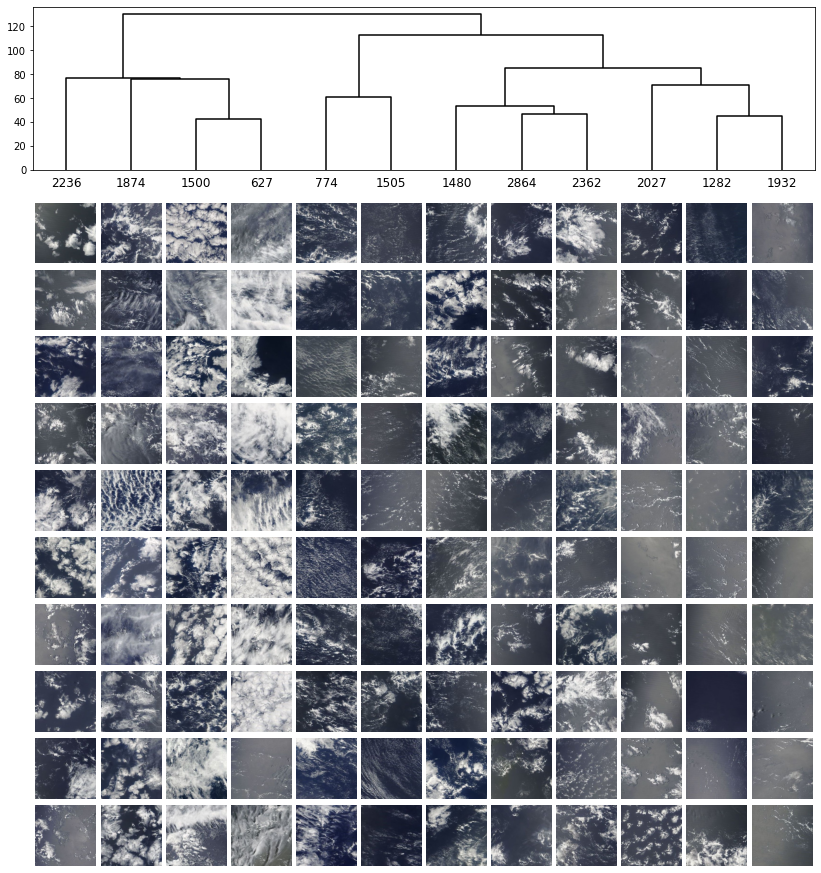

In [19]:
clusters = convml_tt.interpretation.plots.dendrogram(da_embeddings, n_samples=10, n_clusters_max=12, return_clusters=True)

In [20]:
import importlib
import utils
importlib.reload(utils)
print(visualize_boxes_cluster)
print(DATASET_DIR)


4.5.3
<function visualize_boxes_cluster at 0x7f4c21be5940>
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/


/home/fbrient/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/home/fbrient/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED/ /home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/05378_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/00568_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/14804_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/06432_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/02347_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/03109_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/07457_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/07828_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/13328_anchor.png
Tr

True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/14304_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/15841_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/13540_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/15792_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/09721_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/13572_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/13525_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/18751_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/17789_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/12126_anchor.png
True False

True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/09311_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/00892_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/08806_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/03153_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/08439_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/01505_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/14921_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/19027_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/17854_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/19101_anchor.png
True False

True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/04003_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/18393_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/17720_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/01829_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/11490_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/09862_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/05043_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/13060_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/05755_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/17168_anchor.png
True False

True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/15077_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/02712_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/10025_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/05301_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/13745_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/00375_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/09011_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/04840_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/19719_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/08830_anchor.png
True False

True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/10188_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/07644_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/09223_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/15632_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/01391_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/04531_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/15468_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/13508_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/16855_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/13633_anchor.png
True False

True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/11811_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/12121_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/05604_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/05673_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/13506_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/04479_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/15601_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/00750_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/16141_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/15359_anchor.png
True False

True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/05934_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/13874_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/12217_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/18087_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/14875_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/10232_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/10823_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/16364_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/09786_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/19794_anchor.png
True False

True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/02002_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/10921_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/10757_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/07174_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/03485_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/00517_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/15066_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/03832_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/16253_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/01253_anchor.png
True False

True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/02019_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/10355_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/14422_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/15629_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/13834_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/03210_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/12499_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/00768_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/16991_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/15449_anchor.png
True False

True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/11127_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/04665_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/11636_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/00755_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/01200_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/14164_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/02528_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/07045_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/11994_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/10616_anchor.png
True False

True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/19390_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/05479_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/06664_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/07691_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/15799_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/07900_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/18595_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/15434_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/10371_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/17149_anchor.png
True False

True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/04548_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/17507_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/16150_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/16046_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/19467_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/12719_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/02362_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/18029_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/09747_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/14371_anchor.png
True False

True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/07453_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/13077_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/17776_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/08834_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/18527_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/17160_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/16847_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/20388_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/12000_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/19987_anchor.png
True False

True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/05901_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/03771_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/02590_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/05849_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/16061_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/19970_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/08642_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/11511_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/00523_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/13754_anchor.png
True False

True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/09398_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/19129_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/18847_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/06450_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/04768_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/10956_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/16218_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/17542_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/12843_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/19877_anchor.png
True False

True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/08084_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/07393_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/02986_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/18889_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/09357_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/17443_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/10592_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/03008_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/06392_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/04037_anchor.png
True False

True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/09175_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/04927_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/15110_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/04874_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/13167_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/02100_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/13968_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/08123_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/00313_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/16172_anchor.png
True False

True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/08093_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/14102_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/12464_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/03704_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/00864_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/11855_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/01866_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/18634_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/02501_anchor.png
True False
/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_DIVIDED//train/14423_anchor.png
True False

/home/fbrient/GitHub/convml_tt_internship/data_analysis/zooniverse/utils.py:226: DeprecationWarning: `np.str` is a deprecated alias for the builtin `str`. To silence this warning, use `str` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.str_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  ax.set_title('{} - ({})'.format(sample[0], ', '.join(sample[1].astype(np.str))))


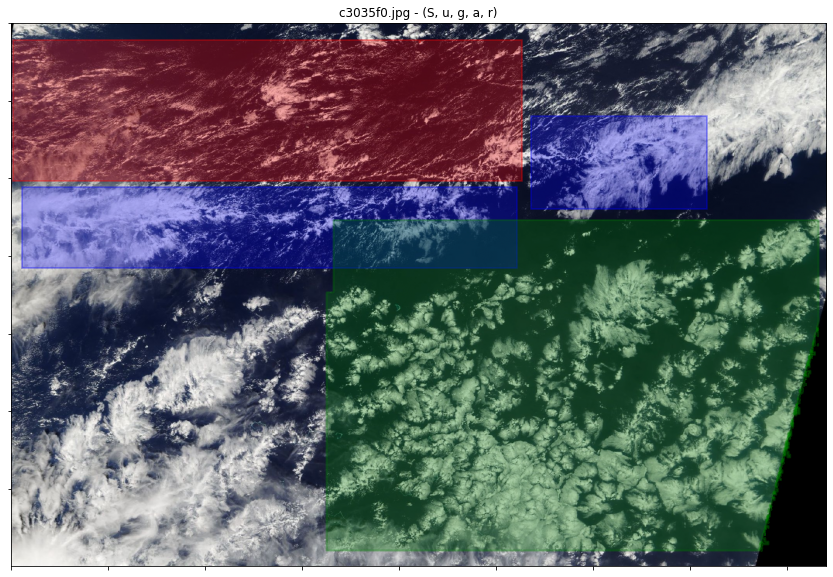

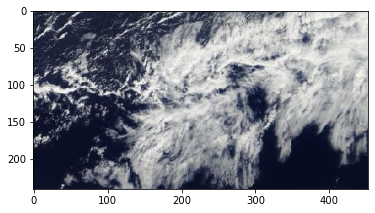

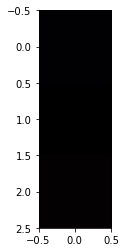

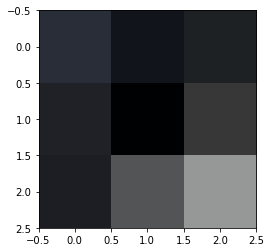

NameError: name 'model' is not defined

In [21]:
# Problem with get_embedding in visualize_boxes_cluster. 
# Why asking the model an other time? How Did Rayan? 
from utils import visualize_boxes_cluster
from utils import visualize_domain
member = randint(0, len(train_samples))
#print(member,train_samples[member],df)
path_tmp = DATASETS_path+ 'ZOONIVERSE_DIVIDED/' #dataset_path
path_train_images = DATASET_DIR
visualize_boxes_cluster(df, train_samples[member],path_tmp,path_train_images)
#visualize_domain(df, train_samples[member],path_tmp,path_train_images)


## Predicting confusion matrices

In [22]:
print(len(clusters[1]))
print(len(labs))

#print(clusters[1])
print(labs)

20463
20463
[0, 0, 0, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 1, 2, 2, 2, 3, 3, 3, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 2, 2, 2, 2, 2, 2, 2, 0, 0, 3, 3, 3, 3, 3, 3, 2, 2, 3, 3, 3, 1, 1, 1, 1, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 3, 3, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 0, 0, 0, 0, 1, 0, 3, 3, 3, 3, 3, 3, 3, 1, 1, 1, 1, 2, 2, 0, 1, 3, 2, 3, 1, 1, 1, 2, 2, 2, 3, 2, 2, 2, 0, 0, 1, 1, 3, 3, 3, 3, 3, 0, 2, 2, 3, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 3, 3, 3, 3, 3, 3, 0, 0, 0, 0, 1, 3, 3, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 2, 2, 2, 2, 2, 2, 3, 3, 3, 0, 3, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 3, 3, 0, 0, 0, 0, 0, 0, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 2, 2, 2, 3, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 3, 3, 3, 3, 3, 3, 3, 3, 2, 2, 3, 3, 3, 3, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

/home/fbrient/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [23]:
cfs_mat = confusion_matrix(labs, clusters[1])

/home/fbrient/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [24]:
print(cfs_mat.shape)
print(cfs_mat[:4,:])
print(cfs_mat)

(12, 12)
[[ 393  560  661  298  104  102  274  512  520  406  214  208]
 [1570  570  535  184   57  106  426 1146  814  876  245  211]
 [ 136  259  157   62  227  239  324  421  425  305  185  362]
 [ 137  485  147   83  386 1058  456  785  603  440  638 1151]]
[[ 393  560  661  298  104  102  274  512  520  406  214  208]
 [1570  570  535  184   57  106  426 1146  814  876  245  211]
 [ 136  259  157   62  227  239  324  421  425  305  185  362]
 [ 137  485  147   83  386 1058  456  785  603  440  638 1151]
 [   0    0    0    0    0    0    0    0    0    0    0    0]
 [   0    0    0    0    0    0    0    0    0    0    0    0]
 [   0    0    0    0    0    0    0    0    0    0    0    0]
 [   0    0    0    0    0    0    0    0    0    0    0    0]
 [   0    0    0    0    0    0    0    0    0    0    0    0]
 [   0    0    0    0    0    0    0    0    0    0    0    0]
 [   0    0    0    0    0    0    0    0    0    0    0    0]
 [   0    0    0    0    0    0    0    0    

/home/fbrient/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/home/fbrient/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


(4, 12)
(4,)
[4252 6740 3102 6369]
(12, 4)


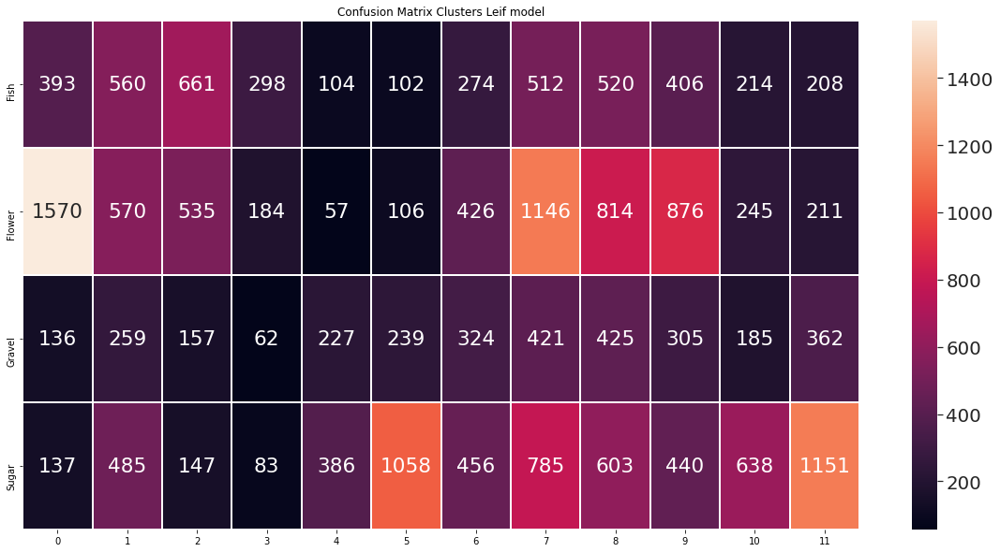

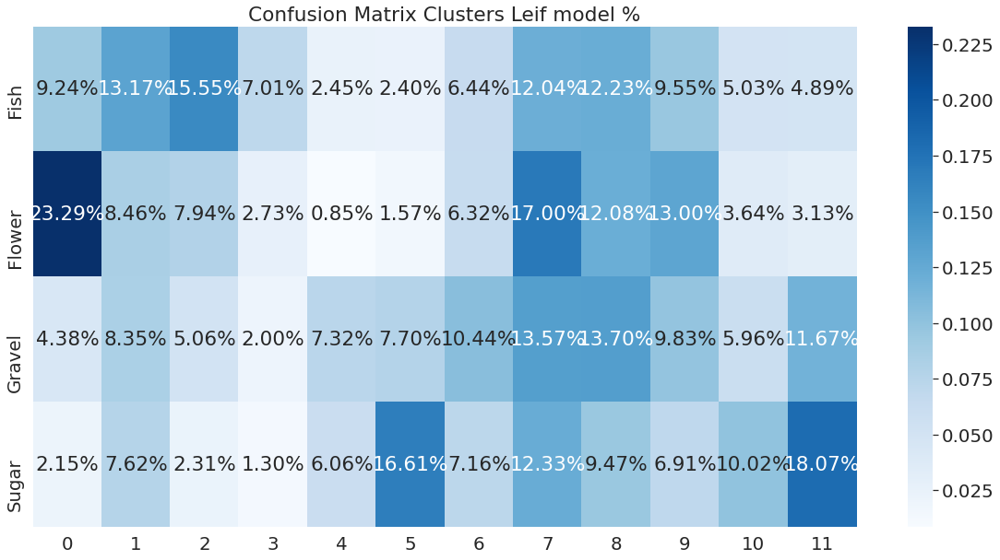

In [25]:
associations = ['Fish', 'Flower', 'Gravel', 'Sugar']

fig, ax = plt.subplots(figsize=(20,10)) 
plt.title("Confusion Matrix Clusters Leif model")
sns.set(font_scale=1.8)
sns.heatmap(cfs_mat[:4,:], annot=True, fmt='', ax=ax, linewidths=.9, yticklabels=associations)
plt.savefig('Confusion_matrix_1.png')

fig, ax = plt.subplots(figsize=(20,10))
print(cfs_mat[:4,:].shape)
print(   np.sum(  cfs_mat[:4,:], axis=1  ).shape  )
print(np.sum(  cfs_mat[:4,:], axis=1  ))
print(   (  cfs_mat[:4,:].T/np.sum(cfs_mat[:4,:], axis=1)    ).shape  )
plt.title("Confusion Matrix Clusters Leif model %")
sns.heatmap( (cfs_mat[:4,:].T/np.sum(cfs_mat[:4,:], axis=1)).T, annot=True, 
            fmt='.2%', cmap='Blues' , yticklabels=associations)
plt.savefig('Confusion_matrix_2.png')


# Random Dirichlet

/home/fbrient/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


4252.0
6740.000000000001
3102.0
6369.000000000001
[[   0.   92.  225.  692.  298.  666.   99.  457.  810.  174.  316.  423.]
 [  88.  506.  796. 1190.  740.  379.  383.  923.  454.  314.  790.  178.]
 [ 154.   58.   77.  107.  738.  372.   72.  742.  259.   80.  343.  100.]
 [ 380. 1150.  640.  444.  115.  661.   94.  276.  950.  290. 1310.   57.]]
(4, 12)
(4,)
(12, 4)


<AxesSubplot:title={'center':'Confusion Matrix Random Dirichlet %'}>

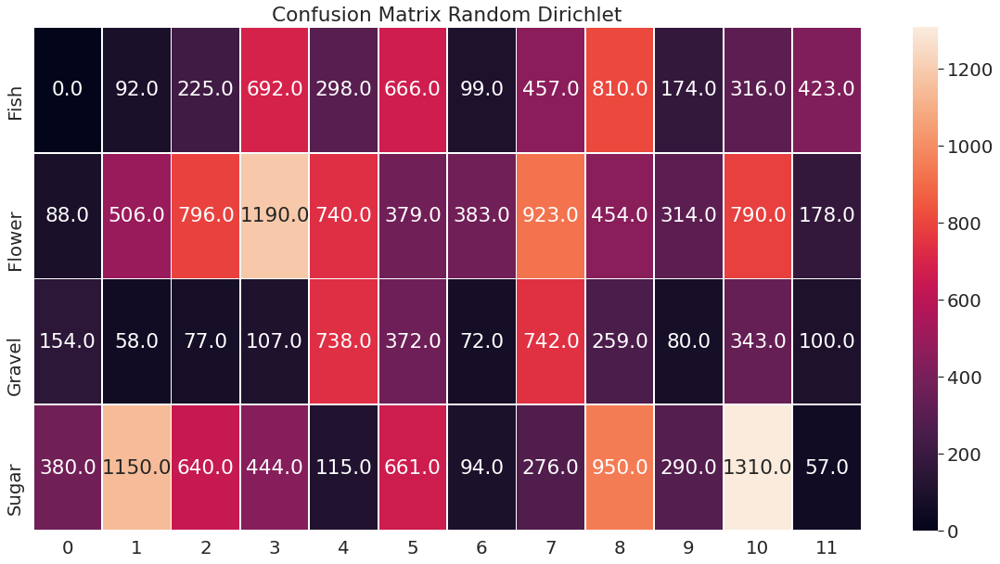

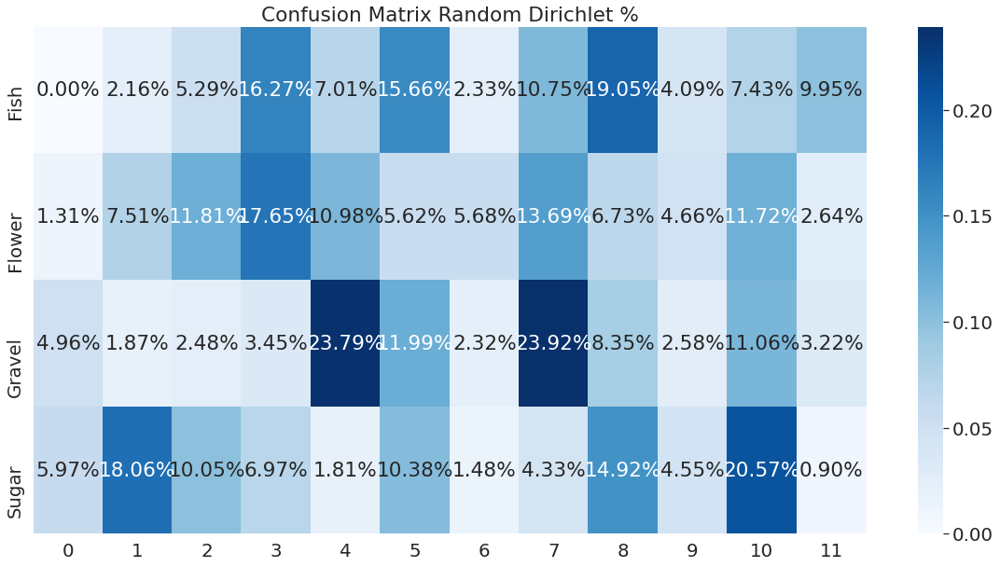

In [26]:
import seaborn as sns
associations = ['Fish', 'Flower', 'Gravel', 'Sugar']
numbers = [4252,6740, 3102, 6369]
conf_mat = []
for num in numbers:
    row = np.random.dirichlet(np.ones(12),size=1)*num
    print(np.sum(row))
    conf_mat.append(np.round(row[0]))
cfs_mat = np.array(conf_mat)
print(cfs_mat)
#cfs_mat = confusion_matrix(labs, clusters[1])

fig, ax = plt.subplots(figsize=(20,10)) 
plt.title("Confusion Matrix Random Dirichlet")


sns.set(font_scale=1.8)
sns.heatmap(cfs_mat[:4,:], annot=True, fmt='', ax=ax, linewidths=.9, yticklabels=associations)
fig, ax = plt.subplots(figsize=(20,10))
print(cfs_mat[:4,:].shape)
print(   np.sum(  cfs_mat[:4,:], axis=1  ).shape  )
print(   (  cfs_mat[:4,:].T/np.sum(cfs_mat[:4,:], axis=1)    ).shape  )
plt.title("Confusion Matrix Random Dirichlet %")
sns.heatmap( (cfs_mat[:4,:].T/np.sum(cfs_mat[:4,:], axis=1)).T, annot=True, 
            fmt='.2%', cmap='Blues' , yticklabels=associations)

# Random Uniform

(4, 12)
(4, 12)
(4,)
(12, 4)


/home/fbrient/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:title={'center':'Confusion Matrix Random Uniform %'}>

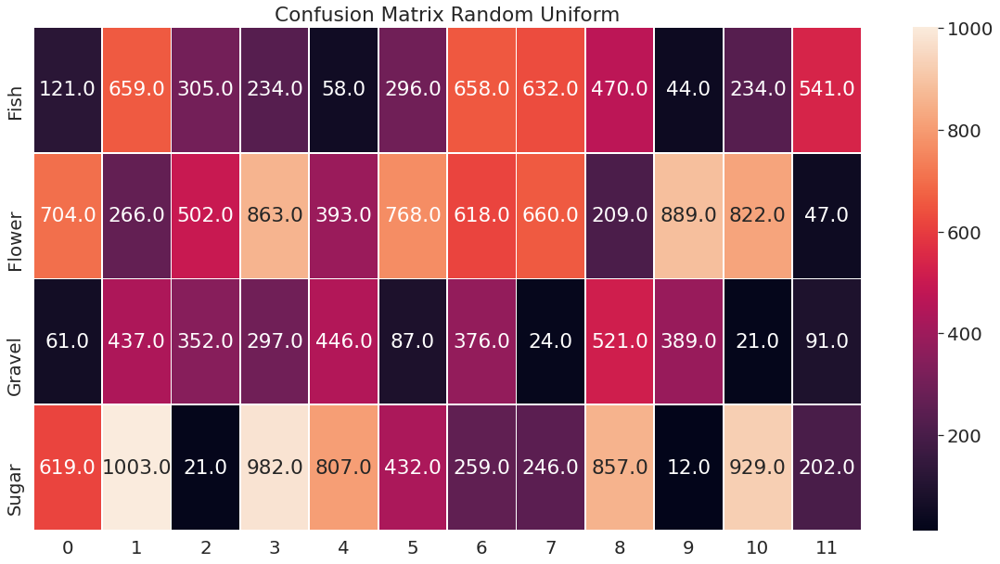

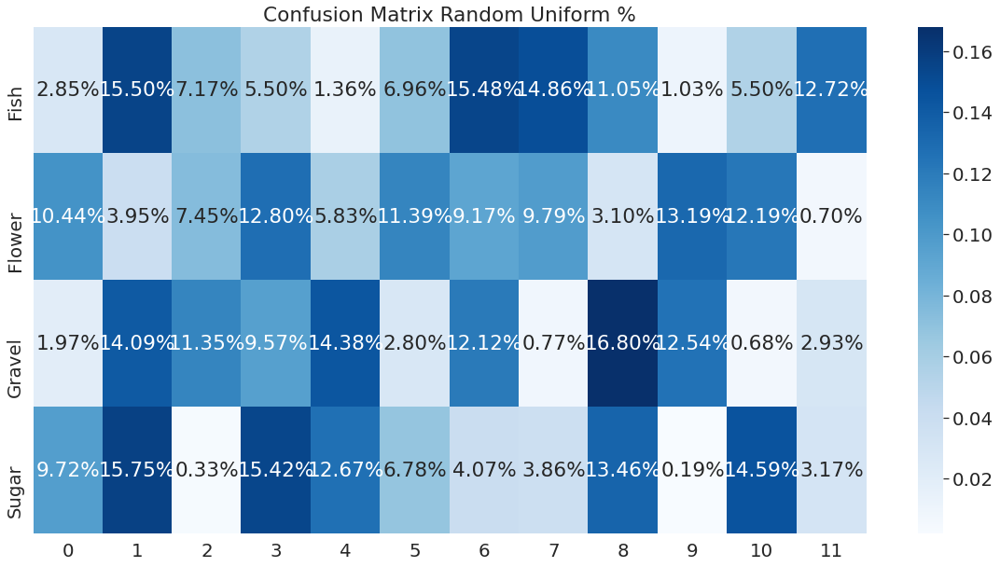

In [27]:
import seaborn as sns
associations = ['Fish', 'Flower', 'Gravel', 'Sugar']
numbers = [4252,6740, 3102, 6369]
conf_mat = []
for num in numbers:
    row = np.random.uniform(size=12)
    row = row/row.sum()
    row = row*num
    #print(row)
    conf_mat.append(np.round(row))
#print(row)
cfs_mat = np.array(conf_mat)
#print(cfs_mat)
#cfs_mat = confusion_matrix(labs, clusters[1])
print(cfs_mat.shape)
fig, ax = plt.subplots(figsize=(20,10))
plt.title("Confusion Matrix Random Uniform")
sns.set(font_scale=1.8)
sns.heatmap(cfs_mat[:4,:], annot=True, fmt='', ax=ax, linewidths=.9, yticklabels=associations)
fig, ax = plt.subplots(figsize=(20,10))
print(cfs_mat[:4,:].shape)
print(   np.sum(  cfs_mat[:4,:], axis=1  ).shape  )
print(   (  cfs_mat[:4,:].T/np.sum(cfs_mat[:4,:], axis=1)    ).shape  )
plt.title("Confusion Matrix Random Uniform %")
sns.heatmap( (cfs_mat[:4,:].T/np.sum(cfs_mat[:4,:], axis=1)).T, annot=True, 
            fmt='.2%', cmap='Blues' , yticklabels=associations)

/home/fbrient/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


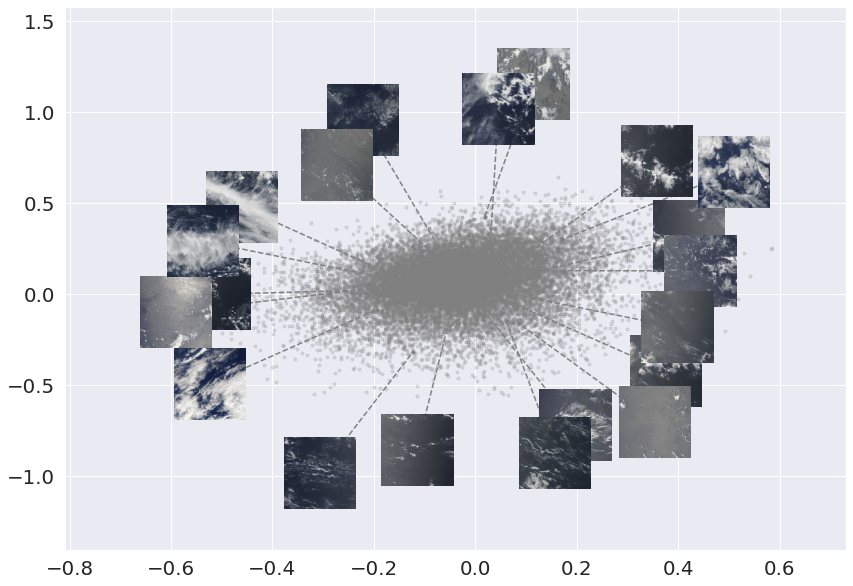

In [77]:

x = da_embeddings.sel(emb_dim=0)
y = da_embeddings.sel(emb_dim=1)
#fig, ax = plt.subplots(figsize=(8,6))
ax = None
#print(da_embeddings.shape)
#print('*')
#print(x.shape)
#print('**')
#print(y)
from convml_tt import *
#import convml_tt.interpretation
#import convml_tt.interpretation.plots
importlib.reload(convml_tt)
#importlib.reload(convml_tt.interpretation)
#importlib.reload(convml_tt.interpretation.plots)
from convml_tt.interpretation.plots import annotated_scatter_plot
#import inspect
#inspect.getfile(np)
#_ = convml_tt.interpretation.plots.annotated_scatter_plot(x=x, y=y, points=20, ax=ax)

# Problem because modifications are not taken into account???
_ = annotated_scatter_plot(x=x, y=y, points=20, ax=ax)

# PCA

In [107]:
print(len(da_embeddings))
pca_2d = PCA(n_components=12, svd_solver='arpack')
print(pca_2d)
principalComponents = pca_2d.fit_transform(da_embeddings)
# this is equivalent to pca_2d.fit(da_embeddings).transform(da_embeddings)

#print(principalComponents.shape)
print(pca_2d.explained_variance_ratio_)
print(pca_2d.explained_variance_ratio_.cumsum())
print('*')
print(pca_2d.components_)
print('**')
print(principalComponents)
print('***')
print(pca_2d.transform(da_embeddings))
print(principalComponents.shape)

20463
PCA(n_components=12, svd_solver='arpack')
[0.17424746 0.1657763  0.10616221 0.08920401 0.06967055 0.06650972
 0.05218073 0.04879547 0.04335011 0.01823532 0.01630585 0.01256535]
[0.17424746 0.34002376 0.44618598 0.53539    0.6050606  0.6715703
 0.723751   0.77254647 0.8158966  0.8341319  0.85043776 0.86300313]
*
[[-0.01834862 -0.11017527 -0.051596   ... -0.09058311 -0.10343969
  -0.08857279]
 [-0.03636762 -0.01954622  0.01603245 ... -0.03783868 -0.01670263
   0.00535356]
 [ 0.05645916  0.00281089  0.1022292  ...  0.00489698  0.04313849
   0.06576901]
 ...
 [ 0.10071995  0.02567895  0.03657354 ...  0.21267377  0.11513457
  -0.02083896]
 [-0.09634875 -0.12400499  0.00223389 ...  0.03115396 -0.03526031
   0.18744098]
 [-0.1569258   0.09166178  0.03793335 ... -0.07326688 -0.09498022
   0.04837365]]
**
[[-1.3272403   1.9654256   1.3123798  ...  0.41915506  0.79459393
   0.2995561 ]
 [-0.8208579   0.4480742   0.39168704 ...  0.20634313  0.39250326
   0.3379322 ]
 [-1.5418384  -0.6789456

/home/fbrient/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/home/fbrient/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


(20463,)
[-1.3272403  -0.8208579  -1.5418384  ... -0.38515487 -0.6882077
 -1.2237787 ]
[2 2 0 ... 9 9 0]






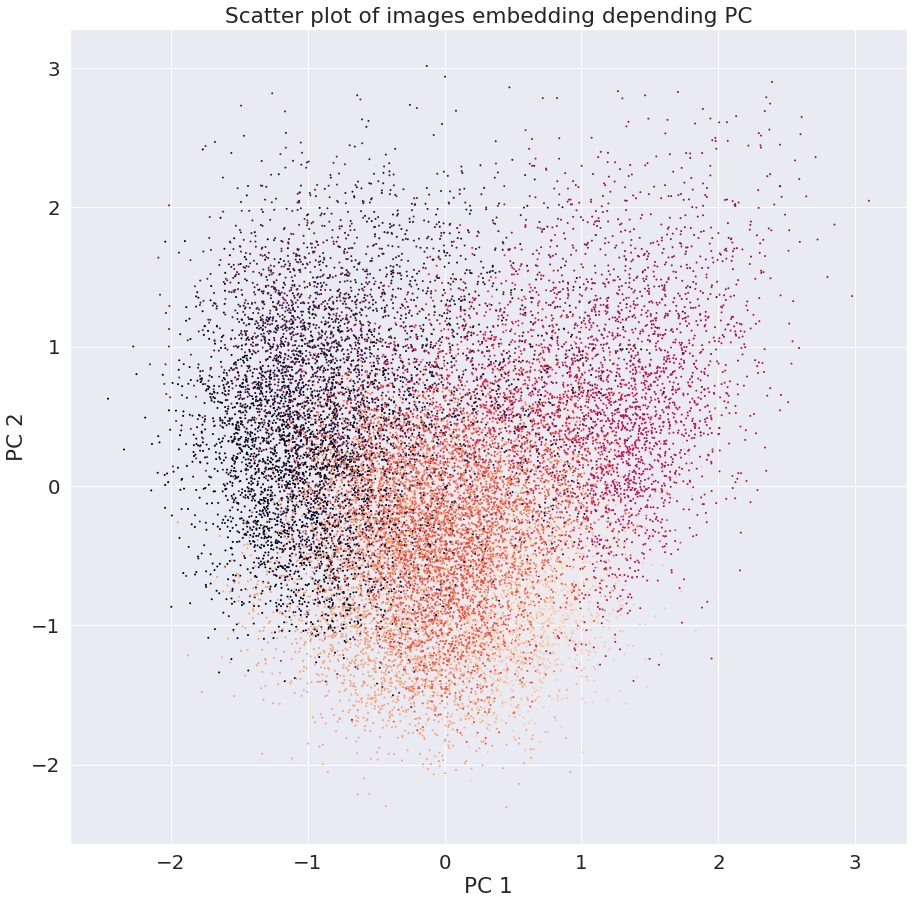

(20258, 12) (205, 12) (20258,) (205,)
[ 1.5762721   0.959216   -1.2070627  ...  0.62290335 -0.53711134
  0.2660437 ] [ 5 11  1 ...  4  2  7]
(205,)
[-1.0871898e+00  6.0302401e-01  5.7688022e-01  3.3827949e-01
 -1.2714164e+00 -1.5373595e+00 -1.1645103e+00 -9.2566401e-02
 -9.5300734e-01 -1.7335159e+00  1.0359324e+00 -2.7076766e-01
 -2.2589001e-01 -5.0085604e-01  5.8464003e-01  1.6206505e+00
 -6.0487205e-01 -3.6467767e-01  1.2297193e-01  5.5437392e-01
 -1.0896851e+00 -2.6637587e-01 -1.3926175e-01 -1.5293870e+00
 -2.7241200e-01  2.3409178e+00  2.3867323e-01  1.9633582e-01
 -3.4782571e-01 -2.3768288e-01 -9.9892139e-01 -3.3049414e-01
 -2.5409508e-01 -1.4162889e-01 -4.2562303e-01  8.6678189e-01
 -3.4752837e-01 -8.4588456e-01 -3.0367377e-01  1.8225750e-01
 -9.9668777e-01 -8.6858130e-01 -6.9347990e-01 -5.0381196e-01
 -8.7830804e-02 -4.0932149e-01  3.5586795e-01 -8.6782050e-01
 -1.4178387e+00 -1.2329755e+00 -2.3036670e-02 -1.4507767e+00
 -4.6286511e-01  2.1222085e-01 -2.7978316e-01 -9.0135622e-0

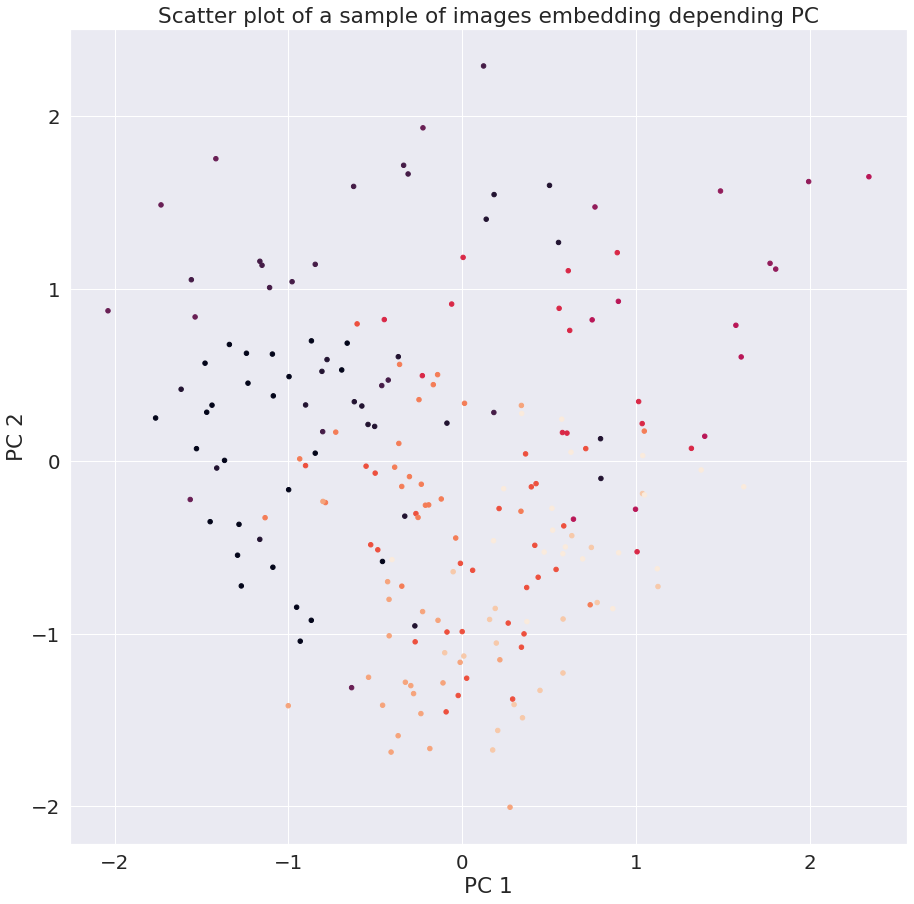

In [122]:
print(principalComponents[:, 0].shape)
print(principalComponents[:, 0])
print(clusters[1])
print("\n\n\n")

fig, ax = plt.subplots(figsize=(15,15))

ax.scatter(principalComponents[:, 0], principalComponents[:, 1], c=clusters[1], s=1)
plt.title('Scatter plot of images embedding depending PC')
ax.set_xlabel('PC 1')
ax.set_ylabel('PC 2')
plt.show()

# Plot a random sample
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split( principalComponents, clusters[1], test_size=0.01, random_state=42)
print(X_train.shape,X_test.shape,y_train.shape,y_test.shape)
print(X_train[:,0],y_train[:])


print(X_test[:, 0].shape)
print(X_test[:, 0])
print("\n\n\n")
fig, ax = plt.subplots(figsize=(15,15))
ax.scatter(X_test[:, 0], X_test[:, 1], c=y_test, s=20)
plt.title('Scatter plot of a sample of images embedding depending PC')
ax.set_xlabel('PC 1')
ax.set_ylabel('PC 2')
plt.show()

# Domain Analysis

/home/fbrient/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/


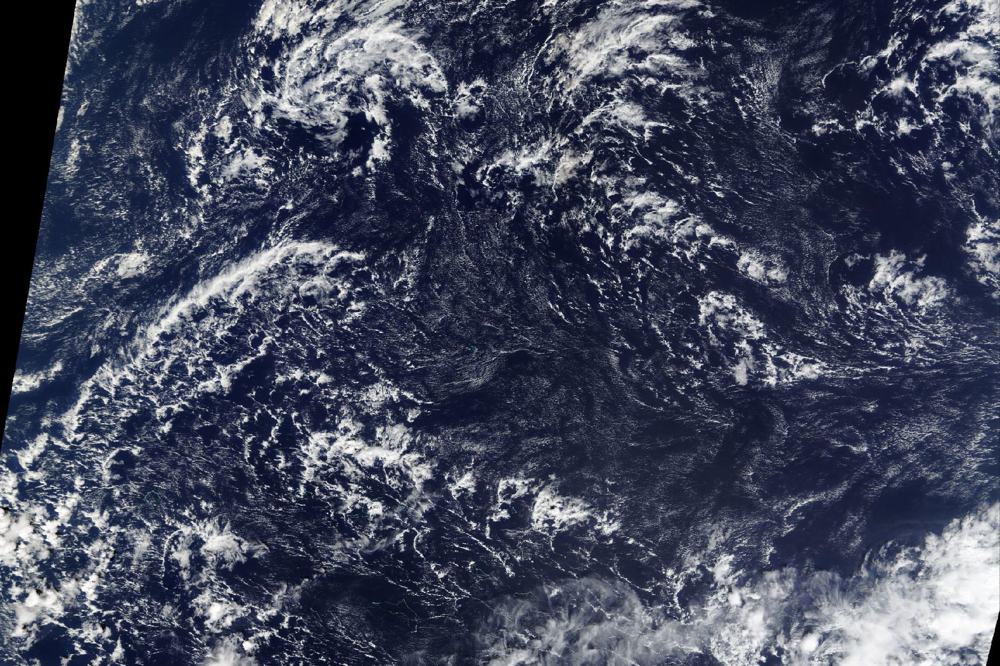

In [124]:
#img = Image.open("../../../NC/zooniverse/train_images/2d9da73.jpg")
print(DATASET_DIR)
img = Image.open(DATASET_DIR+"train_images/2d9da73.jpg")

img

In [125]:
da_emb = make_sliding_tile_model_predictions(img=img, model=model, step=(100, 100))

/home/fbrient/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
100%|██████████| 8/8 [00:07<00:00,  1.03it/s]


In [126]:
print(da_emb.shape)

(100, 19, 12)


/home/fbrient/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
r_aspect = img.size[0] / img.size[1] * 1.4
fig, ax = plt.subplots(figsize=(20, 20))
ax.imshow(img)
da_emb.isel(emb_dim=0).plot(ax=ax, y="j0", alpha=0.3, robust=True)

In [ ]:
da_emb_pca = apply_transform(da_emb, "pca")

r_aspect = img.size[0] / img.size[1] * 1.4
fig, ax = plt.subplots(figsize=(18,18))
ax.imshow(img)
da_emb_pca.isel(pca_dim=0).plot(ax=ax, y="j0", alpha=0.3, robust=True)

In [ ]:
# looking at the second PCA component

r_aspect = img.size[0] / img.size[1] * 1.4
fig, ax = plt.subplots(figsize=(18,18))
ax.imshow(img)
da_emb_pca.isel(pca_dim=1).plot(ax=ax, y="j0", alpha=0.3, robust=True)

In [ ]:
da_rgba = make_rgb(da_emb_pca, pca_dim=[0,1,2], alpha=0.6)
r_aspect = img.size[0] / img.size[1]
fig, ax = plt.subplots(figsize=(18 ,18))
ax.imshow(img)
da_rgba.plot.imshow(rgb="rgba", y="j0", ax=ax)

# Plot PCA Space with classes labels

In [ ]:
print(principalComponents[:, 0].shape)
print(principalComponents[:, 0])
print("\n\n\n")

labs_np = np.array(labs)
X_train, X_test, y_train, y_test = train_test_split( principalComponents, labs, test_size=0.01, random_state=42)




fig, ax = plt.subplots(figsize=(15,15))

scatter = ax.scatter(principalComponents[:, 0], principalComponents[:, 1], c=labs, s=1 , cmap="plasma")
plt.legend(handles=scatter.legend_elements()[0], labels=associations)
plt.title('Scatter plot of images embedding with classes')
ax.set_xlabel('PC 1')
ax.set_ylabel('PC 2')
plt.show()



fig, ax = plt.subplots(figsize=(15,15))

scatter = ax.scatter(X_test[:, 0], X_test[:, 1], c=y_test, s=18 , cmap="plasma")
plt.legend(handles=scatter.legend_elements()[0], labels=associations)
plt.title('Scatter plot of sample of images embedding with classes')
ax.set_xlabel('PC 1')
ax.set_ylabel('PC 2')
plt.show()





clf = NearestCentroid()
clf.fit(principalComponents, labs)
fig, ax = plt.subplots(figsize=(15,15))
print("Centroids : ")
print(clf.centroids_)
print("Shape : "+str(clf.centroids_.shape))
scatter = ax.scatter(clf.centroids_[:, 0], clf.centroids_[:, 1], c=[0, 1, 2, 3], s=45 , cmap="plasma")
plt.legend(handles=scatter.legend_elements()[0], labels=associations)
plt.title('Scatter plot of centroids of each class')
ax.set_xlabel('PC 1')
ax.set_ylabel('PC 2')
plt.show()



# K-Means Clustering

## Training and applying on zooniverse

In [ ]:
#import convml_tt.interpretation
#import convml_tt.interpretation
# convml_tt.interpretation.plots.kmeans

kmeans_clusters, kmeans_model = kmeans(
    da_embeddings,
    save=True,
    visualize=True,
    model_path=None,
    method="optimize",
    )


In [ ]:
cfsss_mat = confusion_matrix(labs, kmeans_clusters)
associations = ['Fish', 'Flower', 'Gravel', 'Sugar']
fig, ax = plt.subplots(figsize=(25,10)) 
plt.title("Confusion Matrix Clusters Leif model")
sns.set(font_scale=1.8)
sns.heatmap(cfsss_mat[:4,:2], annot=True, fmt='', ax=ax, linewidths=.9, yticklabels=associations)
fig, ax = plt.subplots(figsize=(30,10))
plt.title("Confusion Matrix Clusters Leif model %")
sns.heatmap( (cfsss_mat[:4,:2].T/np.sum(cfsss_mat[:4,:2], axis=1)).T, annot=True, 
            fmt='.2%', cmap='Blues' , yticklabels=associations)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split( principalComponents, kmeans_clusters, test_size=0.01, random_state=42)



fig, ax = plt.subplots(figsize=(15,15))

ax.scatter(principalComponents[:, 0], principalComponents[:, 1], c=kmeans_clusters, s=1, cmap="plasma")
plt.title('Scatter plot of images embedding depending PC')
ax.set_xlabel('PC 1')
ax.set_ylabel('PC 2')
plt.show()



fig, ax = plt.subplots(figsize=(15,15))

ax.scatter( X_test[:, 0], X_test[:, 1], c=y_test, s=1, cmap="plasma")
plt.title('Scatter plot of sample of images embedding depending PC')
ax.set_xlabel('PC 1')
ax.set_ylabel('PC 2')
plt.show()


clf = NearestCentroid()
clf.fit(principalComponents, clusters[1])
fig, ax = plt.subplots(figsize=(15,15))
scatter = ax.scatter(clf.centroids_[:, 0], clf.centroids_[:, 1], s=45 , cmap="plasma")
plt.legend(handles=scatter.legend_elements()[0], labels=associations)
plt.title('Scatter plot of centroids of each class')
ax.set_xlabel('PC 1')
ax.set_ylabel('PC 2')
plt.show()


fig, ax = plt.subplots(figsize=(15,15))
ax.scatter(X_test[:, 0], X_test[:, 1], c=y_test, s=20, cmap="plasma")
plt.title('Scatter plot of a sample of images embedding depending PC')
ax.set_xlabel('PC 1')
ax.set_ylabel('PC 2')
plt.show()

## Training on Amazon dataset and applying to zooniverse

In [ ]:
path_kmeans = "kmeans_model.pkl"
dataset_path_amazon =  'data/Nx256_s200000.0_N500study_N2000train/'
tile_dataset_amazon = ImageSingletDataset(data_dir=dataset_path_amazon, tile_type=TileType.ANCHOR)
embd_amazon = get_embeddings(tile_dataset=tile_dataset_amazon, model=model)
clusters_amazon = convml_tt.interpretation.plots.dendrogram(da_embeddings, n_samples=10, n_clusters_max=12, return_clusters=True)


In [ ]:
kmeans_clusters, kmeans_model = kmeans(
    embd_amazon,
    save=True,
    visualize=True,
    model_path=None,
    method="optimize",
    )


In [ ]:
path_kmeans = "kmeans_model.pkl"
kmeans_clusters, kmeans_model = kmeans(
    da_embeddings,
    save=False,
    visualize=True,
    model_path=path_kmeans,
    method="optimize",
    )

In [ ]:
cfsss_mat = confusion_matrix(labs, kmeans_clusters)
associations = ['Fish', 'Flower', 'Gravel', 'Sugar']
fig, ax = plt.subplots(figsize=(25,10)) 
plt.title("Confusion Matrix Clusters Leif model")
sns.set(font_scale=1.8)
sns.heatmap(cfsss_mat[:4,:2], annot=True, fmt='', ax=ax, linewidths=.9, yticklabels=associations)
fig, ax = plt.subplots(figsize=(30,10))
plt.title("Confusion Matrix Clusters Leif model %")
sns.heatmap( (cfsss_mat[:4,:2].T/np.sum(cfsss_mat[:4,:2], axis=1)).T, annot=True, 
            fmt='.2%', cmap='Blues' , yticklabels=associations)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split( principalComponents, kmeans_clusters, test_size=0.01, random_state=42)

fig, ax = plt.subplots(figsize=(15,15))

ax.scatter(principalComponents[:, 0], principalComponents[:, 1], c=kmeans_clusters, s=1, cmap="plasma")
plt.title('Scatter plot of images embedding depending PC')
ax.set_xlabel('PC 1')
ax.set_ylabel('PC 2')
plt.show()



fig, ax = plt.subplots(figsize=(15,15))

ax.scatter( X_test[:, 0], X_test[:, 1], c=y_test, s=1, cmap="plasma")
plt.title('Scatter plot of sample of images embedding depending PC')
ax.set_xlabel('PC 1')
ax.set_ylabel('PC 2')
plt.show()


clf = NearestCentroid()
clf.fit(principalComponents, clusters[1])
fig, ax = plt.subplots(figsize=(15,15))
scatter = ax.scatter(clf.centroids_[:, 0], clf.centroids_[:, 1], s=45 , cmap="plasma")
plt.legend(handles=scatter.legend_elements()[0], labels=associations)
plt.title('Scatter plot of centroids of each class')
ax.set_xlabel('PC 1')
ax.set_ylabel('PC 2')
plt.show()


fig, ax = plt.subplots(figsize=(15,15))
ax.scatter(X_test[:, 0], X_test[:, 1], c=y_test, s=20, cmap="plasma")
plt.title('Scatter plot of a sample of images embedding depending PC')
ax.set_xlabel('PC 1')
ax.set_ylabel('PC 2')
plt.show()

# KMeans untrained with forced 4 clusters

In [ ]:
kmeans_clusters, kmeans_model = kmeans(
    da_embeddings,
    save=True,
    n=4,
    visualize=False,
    model_path=None,
    method=None,
    )

In [ ]:
import seaborn as sns 

cfsss_mat = confusion_matrix(labs, kmeans_clusters)
associations = ['Fish', 'Flower', 'Gravel', 'Sugar']
fig, ax = plt.subplots(figsize=(25,10)) 
plt.title("Confusion Matrix Clusters Leif model")
sns.set(font_scale=1.8)
sns.heatmap(cfsss_mat[:4,:4], annot=True, fmt='', ax=ax, linewidths=.9, yticklabels=associations)
fig, ax = plt.subplots(figsize=(30,10))
plt.title("Confusion Matrix Clusters Leif model %")
sns.heatmap( (cfsss_mat[:4,:4].T/np.sum(cfsss_mat[:4,:4], axis=1)).T, annot=True, 
            fmt='.2%', cmap='Blues' , yticklabels=associations)

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.neighbors import NearestCentroid
X_train, X_test, y_train, y_test = train_test_split( principalComponents, kmeans_clusters, test_size=0.01, random_state=42)

fig, ax = plt.subplots(figsize=(15,15))

ax.scatter(principalComponents[:, 0], principalComponents[:, 1], c=kmeans_clusters, s=1, cmap="plasma")
plt.title('Scatter plot of images embedding depending PC')
ax.set_xlabel('PC 1')
ax.set_ylabel('PC 2')
plt.show()



fig, ax = plt.subplots(figsize=(15,15))

ax.scatter( X_test[:, 0], X_test[:, 1], c=y_test, s=1, cmap="plasma")
plt.title('Scatter plot of sample of images embedding depending PC')
ax.set_xlabel('PC 1')
ax.set_ylabel('PC 2')
plt.show()


clf = NearestCentroid()
clf.fit(principalComponents, clusters[1])
fig, ax = plt.subplots(figsize=(15,15))
scatter = ax.scatter(clf.centroids_[:, 0], clf.centroids_[:, 1], s=45 , cmap="plasma")
plt.legend(handles=scatter.legend_elements()[0], labels=associations)
plt.title('Scatter plot of centroids of each class')
ax.set_xlabel('PC 1')
ax.set_ylabel('PC 2')
plt.show()


fig, ax = plt.subplots(figsize=(15,15))
ax.scatter(X_test[:, 0], X_test[:, 1], c=y_test, s=20, cmap="plasma")
plt.title('Scatter plot of a sample of images embedding depending PC')
ax.set_xlabel('PC 1')
ax.set_ylabel('PC 2')
plt.show()